# <center>Proyecto ANTAD - ITAM</center>
## <center>Ubicación para 200 sucursales de farmacias</center>
### Consolidación de datos

Para este proyecto se utiliza las siguientes fuentes de datos:
- Polígonos de secciones electorales de México del 2024 (agregar liga)
- Información geolocalizada de sucursales de farmacias existentes (DENUE ...) (agregar liga)
- Información estadística de secciones electorales de acuerdo al censo poblacional del 2020 (agregar liga)
- Información de cambios históricos en secciones electorales entre el 2020 y 2024 (https://cartografia.ine.mx/sige8/estadisticos-Geoelectorales)

El objetivo de este notebook es consolidar la información de las tres fuentes en un archivo tabulado que contenga para cada sección electoral la información estadística de la misma, información de la cantidad de sucursales existentes y el polígono de localización.

Posteriormente, el archivo tabulado se utilizará para alimentar un algoritmo de aprendizaje máquina que nos diga cuál es la cantidad adecuada de farmacias para cada sección electoral y así poder ubicar aquellas secciones electorales que aún tienen espacio de instalación de farmacias.

In [30]:
# Importa todas las librerías necesarias
import os
import warnings
import pandas as pd
import numpy as np
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt

from shapely.geometry import Point, polygon
from shapely.ops import cascaded_union

warnings.filterwarnings("ignore") # Ignora los warnings

Los polígonos de las secciones electorales se descargan separados por estado, para facilitar su proceso se unirán todas en un único archivo que contenga las secciones electorales de todo el país.

La información estadística con la que se cuenta de las secciones electorales es del 2020, por lo que es necesario regresar algunas de las secciones electorales del 2024 a sus secciones originales del 2020.

In [31]:
directory = '../mapa_ine_estados_2024' # Directorio donde se encuentran los archivos de las secciones electorales
directories = [name for name in os.listdir(directory) if os.path.isdir(os.path.join(directory, name))]

main_gdf = gpd.GeoDataFrame() # GeoDataFrame donde se almacenarán todas las secciones electorales

for dir in directories:
    file_name = os.path.join(directory, dir, 'seccion.shp')
    gdf = gpd.read_file(file_name)

    gdf['geometry'] = gdf['geometry'].to_crs(epsg=4326) # Cambia la proyección de las secciones electorales a WGS84
    main_gdf = pd.concat([main_gdf, gdf], axis=0, ignore_index=True) # Agrega las secciones de est estado al GeoDataFrame general

main_gdf = main_gdf.drop(['ID', 'DISTRITO_F', 'DISTRITO_L', 'MUNICIPIO', 'TIPO', 'CONTROL', 'GEOMETRY1_'], axis=1) # Elimina columnas que no se usan
print(main_gdf.shape)


(71541, 3)


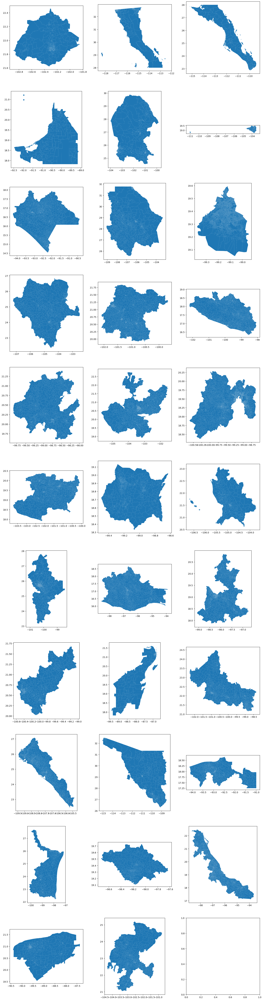

In [32]:
# Grafica las secciones del 2024 por estado para validar que el país está cubierto
fig, axes = plt.subplots(11, 3, figsize=(20, 80))

for ent, ax in zip(range(1, 33), axes.flatten()):
    main_gdf[(main_gdf.ENTIDAD == ent)].plot(ax=ax)

plt.show()


In [33]:
# Carga el archivo de cambios en las secciones electorales y une las secciones que se separaron del 2020 al 2024
changes = pd.read_csv('../mapa_ine_estados_2024/cambios_secciones_2020-2024.csv')
changes['id_ent_sec'] = changes['cve_ent'].astype(str) + '-' + changes['ORIGEN'].astype(str) 

# Mezcla los polígonos de las secciones electorales que se unen
start = 0
end = 0
new_rows = {}
cnt = 0

general_gdf = main_gdf.copy()
print(general_gdf.shape, changes.shape)
for index in range(1, changes.shape[0]):
    if changes.iloc[index]['id_ent_sec'] == changes.iloc[index-1]['id_ent_sec']:
        end = index
        continue

    # Une los poligonos de las secciones pasadas
    polygons = []
    for i in range(start, end+1):
        cnt += 1
        polygons.append(general_gdf[(general_gdf['ENTIDAD'] == changes.iloc[i]['cve_ent']) & (general_gdf['SECCION'] == changes.iloc[i]['seccion'])]['geometry'])

        # Elimina las filas de las secciones que se unieron en general_gdf
        general_gdf = general_gdf[~((general_gdf['ENTIDAD'] == changes.iloc[i]['cve_ent']) & (general_gdf['SECCION'] == changes.iloc[i]['seccion']))]

    union = cascaded_union(polygons)

    # Agrega una nueva fila a general_gdf con el poligono unido
    new_rows[str(index)] = {'ENTIDAD': changes.iloc[start]['cve_ent'], 'SECCION': changes.iloc[start]['ORIGEN'], 'geometry': union}

    start = index
    end = start
print(cnt)
print(general_gdf.shape)

tmp_gdf = pd.DataFrame.from_dict(new_rows, orient='index')
general_gdf = pd.concat([general_gdf, tmp_gdf], axis=0, ignore_index=True)

print(general_gdf.shape)
general_gdf.to_file('../mapa_ine_estados_2024/secciones_electorales.shp') # Guarda el GeoDataFrame general


(71541, 3) (3484, 4)
3483
(68058, 3)
(68899, 3)


In [34]:
# Calcula el área de las secciones electorales y las agrega al dataFrame general
general_gdf['area'] = general_gdf['geometry'].area

print(general_gdf.head(4))

   ENTIDAD  SECCION                                           geometry  \
0        1      148  POLYGON ((-102.26583 21.87539, -102.26562 21.8...   
1        1      499  POLYGON ((-102.25238 21.90503, -102.25202 21.9...   
2        1      443  POLYGON ((-102.23251 22.35295, -102.23233 22.3...   
3        1      500  POLYGON ((-102.25381 21.90466, -102.25327 21.9...   

       area  
0  0.000007  
1  0.000005  
2  0.000088  
3  0.000005  


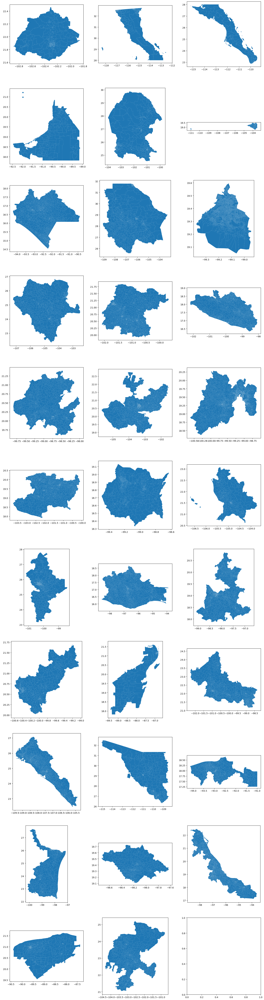

In [35]:
# Grafica las secciones del 2024 por estado para validar que no se crearon huecos
fig, axes = plt.subplots(11, 3, figsize=(20, 80))

for ent, ax in zip(range(1, 33), axes.flatten()):
    general_gdf[(general_gdf.ENTIDAD == ent)].plot(ax=ax)

plt.show()


Con la información obtenida del DENUE se complementa cada sección con la cantidad de farmacias instaladas. Se añade además información de cantidad de farmacias con y sin súpermercado, así como cantidad de farmacias que tengan establecidas menos de 1 años, menos de 3 años, menos de 5 años y 5 años o más. El tiempo de creación considera que el censo tiene información del 2020.

- Primero se requiere extraer la información correspondiente a farmacias.
- Luego ha que agregar la información al archivo de secciones electorales.

In [36]:
path_DENUE = '../DENUE'
DENUE_df = pd.read_csv(os.path.join(path_DENUE, 'denue_inegi_46321-46531_.csv'), encoding="ISO-8859-1")

desired_colums = ['latitud', 'longitud', 'entidad', 'fecha_alta']

pharmacies_without = DENUE_df[DENUE_df['codigo_act'] == 464111] # Farmacias que no tienen super
pharmacies_without = pharmacies_without[desired_colums] # Selecciona las columnas deseadas
pharmacies_without['super'] = 0 # Agrega una columna para indicar super (0 = no tiene super, 1 = tiene super)

pharmacies_with_super = DENUE_df[DENUE_df['codigo_act'] == 464112] # Farmacias que tienen super
pharmacies_with_super = pharmacies_with_super[desired_colums]
pharmacies_with_super['super'] = 1 

state_codes = {
    'Aguascalientes': 1,
    'Baja California': 2,
    'Baja California Sur': 3,
    'Campeche': 4,
    'Coahuila de Zaragoza': 5,
    'Colima': 6,
    'Chiapas': 7,
    'Chihuahua': 8,
    'Ciudad de México': 9,
    'Durango': 10,
    'Guanajuato': 11,
    'Guerrero': 12,
    'Hidalgo': 13,
    'Jalisco': 14,
    'México': 15,
    'Michoacán de Ocampo': 16,
    'Morelos': 17,
    'Nayarit': 18,
    'Nuevo León': 19,
    'Oaxaca': 20,
    'Puebla': 21,
    'Querétaro': 22,
    'Quintana Roo': 23,
    'San Luis Potosí': 24,
    'Sinaloa': 25,
    'Sonora': 26,
    'Tabasco': 27,
    'Tamaulipas': 28,
    'Tlaxcala': 29,
    'Veracruz de Ignacio de la Llave': 30,
    'Yucatán': 31,
    'Zacatecas': 32
}

pharmacies_df = pd.concat([pharmacies_without, pharmacies_with_super], axis=0, ignore_index=True) # Concatena las farmacias con y sin super
pharmacies_df['entidad'] = pharmacies_df['entidad'].replace(state_codes) # Cambia el nombre de los estados por su clave
pharmacies_df.to_csv(os.path.join(path_DENUE, 'farmacias.csv'), index=False)

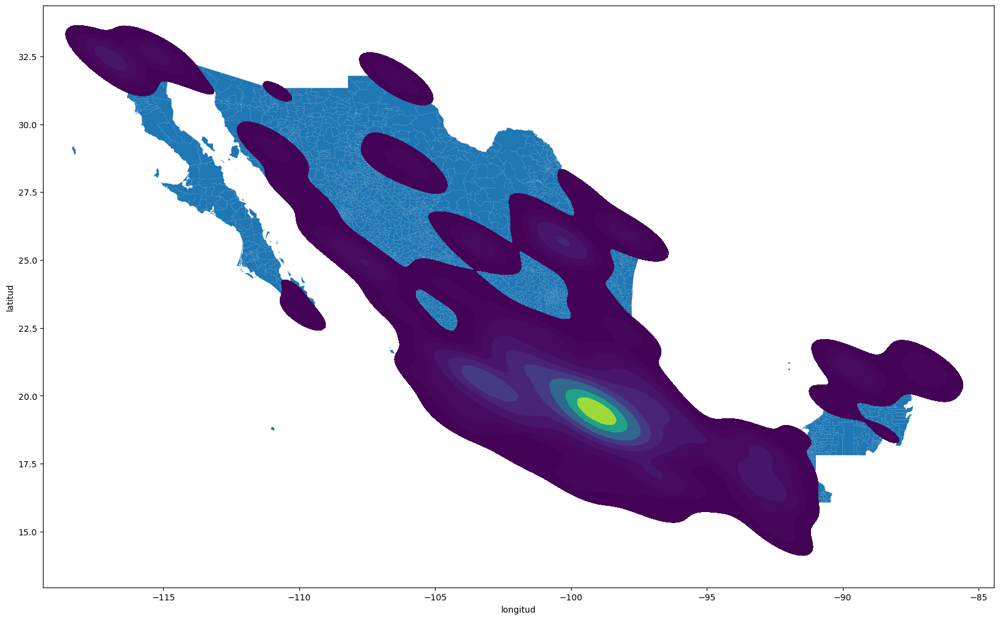

In [40]:
# Grafica la densidad de farmacias
fig, ax = plt.subplots(figsize=(20, 20))
general_gdf.plot(ax=ax) 
sns.kdeplot(ax=ax, x=pharmacies_df['longitud'], y=pharmacies_df['latitud'], cmap='viridis', shade=True, shade_lowest=False, legend=True) 
plt.show() 

In [41]:
# Asigna las farmacias a la sección electoral que les corresponda
total = np.zeros(general_gdf.shape[0])
with_super = np.zeros(general_gdf.shape[0])
without_super = np.zeros(general_gdf.shape[0])
less_than_1 = np.zeros(general_gdf.shape[0])
less_than_3 = np.zeros(general_gdf.shape[0])
less_than_5 = np.zeros(general_gdf.shape[0])
more_than_5 = np.zeros(general_gdf.shape[0])

for lat, lon, date, super in pharmacies_df[['latitud', 'longitud', 'fecha_alta', 'super']].values:
    
    section = general_gdf[general_gdf.geometry.contains(Point(lon, lat))] # Localiza la sección electoral a la que pertenece la farmacia
    if section.empty:
        print(f'Farmacia no encontrada en ninguna sección electoral ({lat}, {lon})')
        continue

    # Actualiza los contadores de cada seccion
    total[section.index] = total[section.index] + 1
    if super == 0:
        without_super[section.index] = without_super[section.index] + 1
    else:
        with_super[section.index] = with_super[section.index] + 1
    year = int(date.replace(' ', '-').split('-')[0])
    if year >= 2020:
        less_than_1[section.index] = less_than_1[section.index] + 1
    elif year >= 2018:
        less_than_3[section.index] = less_than_3[section.index] + 1
    elif year >= 2016:
        less_than_5[section.index] = less_than_5[section.index] + 1
    else:
        more_than_5[section.index] = more_than_5[section.index] + 1

# Agrega las columnas al GeoDataFrame general_gdf
general_gdf['farm_total'] = total
general_gdf['farm_con_super'] = with_super
general_gdf['farm_sin_super'] = without_super
general_gdf['farm_1_anio'] = less_than_1
general_gdf['farm_3_anios'] = less_than_3
general_gdf['farm_5_anios'] = less_than_5
general_gdf['farm_antiguas'] = more_than_5

# Guarda el GeoDataFrame general_gdf actualizado
general_gdf.to_file('../mapa_ine_estados_2024/secciones_electorales_farmacias.shp')

Farmacia no encontrada en ninguna sección electoral (22.88586812, -109.91113345)
Farmacia no encontrada en ninguna sección electoral (19.39165629, -99.03782783)
Farmacia no encontrada en ninguna sección electoral (19.39165513, -99.03782529)
Farmacia no encontrada en ninguna sección electoral (21.11726997, -86.75840678)
Farmacia no encontrada en ninguna sección electoral (31.30371243, -113.55207053)
Farmacia no encontrada en ninguna sección electoral (31.30407128, -113.5519862)
Farmacia no encontrada en ninguna sección electoral (31.30418901, -113.55213962)
Farmacia no encontrada en ninguna sección electoral (31.30408702, -113.55187151)
Farmacia no encontrada en ninguna sección electoral (31.3032174, -113.55122395)
Farmacia no encontrada en ninguna sección electoral (31.30470821, -113.55205528)
Farmacia no encontrada en ninguna sección electoral (31.30435135, -113.55215383)
Farmacia no encontrada en ninguna sección electoral (31.3045111, -113.55215522)
Farmacia no encontrada en ninguna 

In [42]:
def state_name(code):
    for key, value in state_codes.items():
        if value == code:
            return key

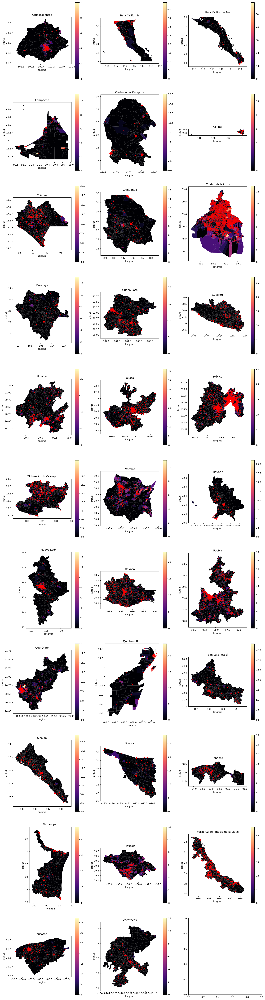

In [43]:
# Grafica las secciones que tienen farmacias por estado
fig, axes = plt.subplots(11, 3, figsize=(20, 80))

for ent, ax in zip(range(1, 33), axes.flatten()):
    general_gdf[(general_gdf.ENTIDAD == ent)].plot(ax=ax, column='farm_total', cmap='magma', legend=True)
    pharmacies_df[pharmacies_df.entidad == ent].plot(ax=ax, kind='scatter', x='longitud', y='latitud', marker='o', color='red', alpha=0.3, s=7)
    ax.set_title(f'{state_name(ent)}')

plt.show()


Finalmente se agrega la información estadística del INE a cada sección electoral.

Para decidir qué información agregar se modificó el diccionario de datos "ECEG_dic.csv" y se agregó una nueva columna "seleccionados", poniendo 1 ó 0 en esta columna se decide que campos agregar a la información de la sección.

In [44]:
path_INE = '../INE'

# Carga las columnas seleccionadas para agregar.
ECEG_df = pd.read_csv(os.path.join(path_INE, 'ECEG_dic.csv'), encoding="ISO-8859-1")
col_names = list(ECEG_df[ECEG_df['seleccionados'] == 1]['Mnemonico'].values)

# Carga la información estadística del censo
stat_data = pd.read_csv(os.path.join(path_INE, 'censo_2020.csv'), encoding="ISO-8859-1")
stat_data = stat_data[col_names]

# El censo es del 2020 y las secciones electorales del 2024. Hay discrepancia en la cantidad de secciones.
# Obten las secciones comunes en ambos archivos para combinarlas y desechar lo demás.

sections_gdf = general_gdf
sections_gdf['id_ent_secc'] = sections_gdf.ENTIDAD.astype(str) + '-' + sections_gdf.SECCION.astype(str)
sections_gdf.sort_values('id_ent_secc', inplace=True)

stat_data['id_ent_secc'] = stat_data.ENTIDAD.astype(str) + '-' + stat_data.SECCION.astype(str)
stat_data.sort_values('id_ent_secc', inplace=True)

merged_data = sections_gdf.merge(stat_data, on='id_ent_secc', how='inner')

missing_sections = len(sections_gdf) - len(merged_data)
missing_stat_data = len(stat_data) - len(merged_data)

print(f"Secciones electorales luego de unir: {len(merged_data)}")
print(f"Secciones faltantes de información del censo: {missing_stat_data}")
print(f"Secciones faltantes de información de las secciones: {missing_sections}")

# Guarda el GeoDataFrame con la información concentrada
merged_data.to_file('../Consolidados/Secciones.shp')

Secciones electorales luego de unir: 68679
Secciones faltantes de información del censo: 127
Secciones faltantes de información de las secciones: 220


In [45]:
merged_data.shape

(68679, 81)

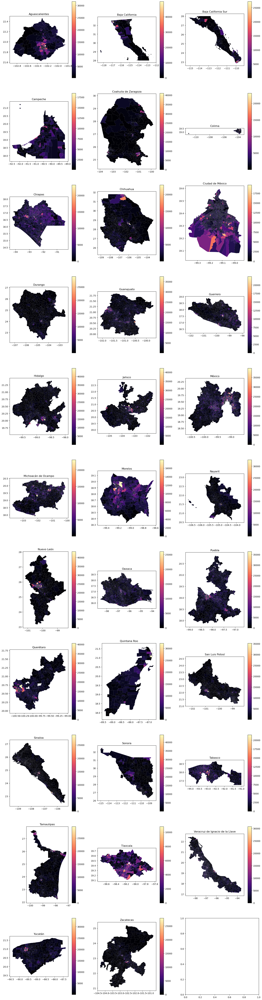

In [46]:
# Grafica las secciones según su población
fig, axes = plt.subplots(11, 3, figsize=(20, 80))

for ent, ax in zip(range(1, 33), axes.flatten()):
    merged_data[(merged_data.ENTIDAD_x == ent)].plot(ax=ax, column='POBTOT', cmap='magma', legend=True)
    #pharmacies_df[pharmacies_df.entidad == ent].plot(ax=ax, kind='scatter', x='longitud', y='latitud', marker='o', color='red', alpha=0.3, s=5)
    ax.set_title(f'{state_name(ent)}')

plt.show()

In [47]:
merged_data.to_csv('../Consolidados/training_set.csv', index=False)